In [59]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import (
    FunctionTransformer,
    RobustScaler,
    OneHotEncoder,
    OrdinalEncoder,
    LabelEncoder   
)
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import (
    train_test_split,
    RepeatedStratifiedKFold,
    cross_val_score
)

In [2]:
df = pd.read_csv('../data/Data_for_UCI_named.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


In [4]:
df.nunique()

tau1     10000
tau2     10000
tau3     10000
tau4     10000
p1       10000
p2       10000
p3       10000
p4       10000
g1       10000
g2       10000
g3       10000
g4       10000
stab     10000
stabf        2
dtype: int64

In [33]:
fig = px.bar(
    data_frame=df.groupby('stabf').size().reset_index(name='count'), 
    x='stabf',
    y='count',
    color='stabf',
    color_discrete_map={'unstable': 'gold', 'stable': 'blue'},
    text_auto=True,
    template='plotly_white',
    title='Count of Stable and Unstable Classes')

fig.update_layout(
    xaxis_title='Class',
    yaxis_title='Count',
    showlegend=False,
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=True, color='Grey'),
    font=dict(family='Arial', size=14, color='Black')
)
fig.show()

In [ ]:
=

In [ ]:
rb_scaler = RobustScaler()


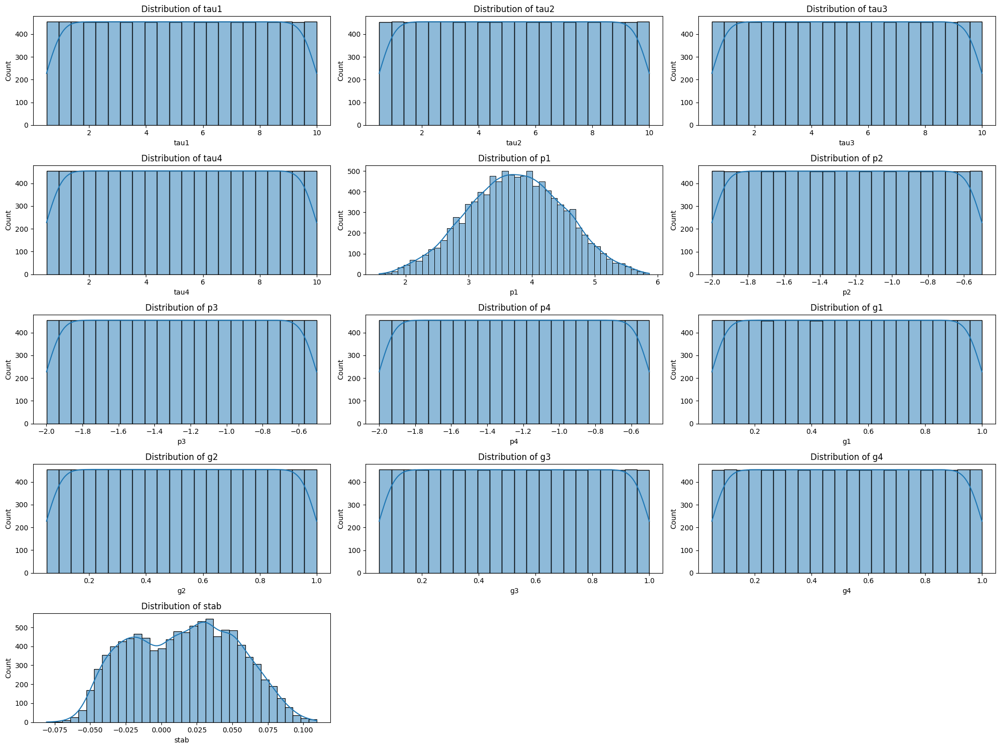

In [50]:
num_columns = len(df.columns[:-1])
plt.figure(figsize=(20, 15))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot((num_columns // 3) + 1, 3, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

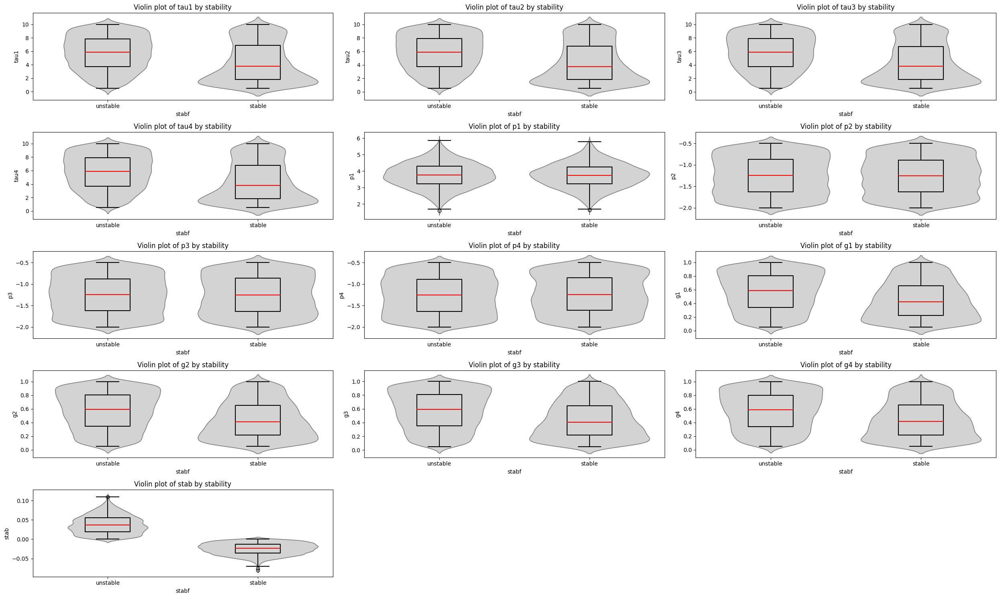

In [56]:
plt.figure(figsize=(25, 15))
for i, column in enumerate(df.columns[:-1], 1):
    plt.subplot((num_columns // 3) + 1, 3, i)
    sns.violinplot(x=df['stabf'], y=df[column], color='lightgrey', inner=None)
    sns.boxplot(x=df['stabf'], y=df[column], width=.3, color='black', medianprops=dict(color='red'), fill=None)
    plt.title(f'Violin plot of {column} by stability')
plt.tight_layout()
plt.show()

In [84]:
fig = go.Figure(data=go.Splom(
    dimensions=[{'label': col, 'values': df[col]} for col in df.columns[:-1]],
    showupperhalf=False,
    text=df['stabf'],
    marker=dict(
        color=df['stabf'].replace({'unstable': 'gold', 'stable': 'blue'}),
        showscale=False,
        line_color='black',
        line_width=0.5)
    ))
fig.update_layout(
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
    title='Elictrical Grid Stability',
    width=1000,
    height=600,
)
fig.show()

In [71]:
num_columns = len(df.columns[:-1])

# Create subplots: one for each feature
fig = make_subplots(rows=(num_columns // 3) + 1, cols=3, subplot_titles=df.columns[:-1])

# Add violin plots to the subplots
for i, column in enumerate(df.columns[:-1], 1):
    row = (i - 1) // 3 + 1
    col = (i - 1) % 3 + 1
    fig.add_trace(go.Violin(
        x=df['stabf'],
        y=df[column],
        box_visible=True,
        line_color='black',
        meanline_visible=True,
        meanline=dict(color='red', width=2),
        fillcolor='lightgrey',
        opacity=.6,
        name=column,
        showlegend=False
    ), row=row, col=col)

fig.update_layout(
    title_text="Violin and Box Plots by Stability",
    height=1200,
    width=1500,
    template='plotly_white'
)

fig.show()